# Clean trajectory
This notebook presents a general cleaning process to clean a moving pandas trajectory loaded from gpx file

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import gpxpy
import gpxpy.gpx
from fiona.crs import from_epsg
from keplergl import KeplerGl
import geopandas as gpd
import movingpandas as mpd
import uuid
import hvplot.pandas
from pyproj import CRS


In [2]:

# Injected parameters
from dagster import seven as __dm_seven
import dagstermill as __dm_dagstermill
context = __dm_dagstermill._reconstitute_job_context(
    **{
        key: __dm_seven.json.loads(value)
        for key, value
        in {'executable_dict': '{"__class__": "ReconstructablePipeline", "asset_selection": {"__frozenset__": [{"__class__": "AssetKey", "path": ["MG91_20230428_artefacto", "raw_explore", "MG91_artefacto_reloj_20230428_01_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_artefacto", "raw_explore", "MG91_artefacto_reloj_20230428_02_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_artefacto", "trajectory_clean", "MG91_artefacto_reloj_20230428_01_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_artefacto", "trajectory_clean", "MG91_artefacto_reloj_20230428_02_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_artefacto_traj"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_artefacto_traj_line"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona", "raw_explore", "MG91_persona_reloj_20230428_01_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona", "raw_explore", "MG91_persona_reloj_20230428_02_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona", "trajectory_clean", "MG91_persona_reloj_20230428_01_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona", "trajectory_clean", "MG91_persona_reloj_20230428_02_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona_traj"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona_traj_line"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto", "raw_explore", "MG91_artefacto_reloj_20230503_01_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto", "raw_explore", "MG91_artefacto_reloj_20230503_02_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto", "trajectory_clean", "MG91_artefacto_reloj_20230503_01_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto", "trajectory_clean", "MG91_artefacto_reloj_20230503_02_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto_traj"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto_traj_line"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona", "raw_explore", "MG91_persona_reloj_20230503_01_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona", "raw_explore", "MG91_persona_reloj_20230503_02_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona", "trajectory_clean", "MG91_persona_reloj_20230503_01_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona", "trajectory_clean", "MG91_persona_reloj_20230503_02_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona_traj"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona_traj_line"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230428_01"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230428_01_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230428_02"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230428_02_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230503_01"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230503_01_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230503_02"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230503_02_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_traj"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230428_01"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230428_01_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230428_02"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230428_02_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230503_01"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230503_01_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230503_02"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230503_02_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_persona_traj"]}, {"__class__": "AssetKey", "path": ["dbt", "my_first_dbt_model"]}, {"__class__": "AssetKey", "path": ["dbt", "my_second_dbt_model"]}, {"__class__": "AssetKey", "path": ["dbt", "traj"]}, {"__class__": "AssetKey", "path": ["trajectories"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230428_artefacto", "gpx", "MG91_artefacto_reloj_20230428_01_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230428_artefacto", "gpx", "MG91_artefacto_reloj_20230428_02_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230428_persona", "gpx", "MG91_persona_reloj_20230428_01_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230428_persona", "gpx", "MG91_persona_reloj_20230428_02_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230503_artefacto", "gpx", "MG91_artefacto_reloj_20230503_01_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230503_artefacto", "gpx", "MG91_artefacto_reloj_20230503_02_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230503_persona", "gpx", "MG91_persona_reloj_20230503_01_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230503_persona", "gpx", "MG91_persona_reloj_20230503_02_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230428_01_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230428_01_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230428_02_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230428_02_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230503_01_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230503_01_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230503_02_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230503_02_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230428_01_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230428_01_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230428_02_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230428_02_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230503_01_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230503_01_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230503_02_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230503_02_traj_clean"]}]}, "pipeline_name": "__ASSET_JOB", "repository": {"__class__": "ReconstructableRepository", "container_context": null, "container_image": null, "entry_point": ["dagster"], "executable_path": "/home/jag/anaconda3/envs/llacta-rumbos/bin/python3.10", "pointer": {"__class__": "ModuleCodePointer", "fn_name": "defs", "module": "tutorial_project", "working_directory": "/home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project"}, "repository_load_data": null}, "solid_selection_str": null}', 'job_run_dict': '{"__class__": "PipelineRun", "asset_selection": {"__frozenset__": [{"__class__": "AssetKey", "path": ["MG91_20230428_artefacto", "raw_explore", "MG91_artefacto_reloj_20230428_01_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_artefacto", "raw_explore", "MG91_artefacto_reloj_20230428_02_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_artefacto", "trajectory_clean", "MG91_artefacto_reloj_20230428_01_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_artefacto", "trajectory_clean", "MG91_artefacto_reloj_20230428_02_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_artefacto_traj"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_artefacto_traj_line"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona", "raw_explore", "MG91_persona_reloj_20230428_01_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona", "raw_explore", "MG91_persona_reloj_20230428_02_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona", "trajectory_clean", "MG91_persona_reloj_20230428_01_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona", "trajectory_clean", "MG91_persona_reloj_20230428_02_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona_traj"]}, {"__class__": "AssetKey", "path": ["MG91_20230428_persona_traj_line"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto", "raw_explore", "MG91_artefacto_reloj_20230503_01_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto", "raw_explore", "MG91_artefacto_reloj_20230503_02_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto", "trajectory_clean", "MG91_artefacto_reloj_20230503_01_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto", "trajectory_clean", "MG91_artefacto_reloj_20230503_02_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto_traj"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_artefacto_traj_line"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona", "raw_explore", "MG91_persona_reloj_20230503_01_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona", "raw_explore", "MG91_persona_reloj_20230503_02_explore"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona", "trajectory_clean", "MG91_persona_reloj_20230503_01_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona", "trajectory_clean", "MG91_persona_reloj_20230503_02_traj_clean_jupyter"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona_traj"]}, {"__class__": "AssetKey", "path": ["MG91_20230503_persona_traj_line"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230428_01"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230428_01_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230428_02"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230428_02_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230503_01"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230503_01_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230503_02"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_reloj_20230503_02_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_artefacto_traj"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230428_01"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230428_01_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230428_02"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230428_02_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230503_01"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230503_01_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230503_02"]}, {"__class__": "AssetKey", "path": ["MG91_persona_reloj_20230503_02_traj_smooth"]}, {"__class__": "AssetKey", "path": ["MG91_persona_traj"]}, {"__class__": "AssetKey", "path": ["dbt", "my_first_dbt_model"]}, {"__class__": "AssetKey", "path": ["dbt", "my_second_dbt_model"]}, {"__class__": "AssetKey", "path": ["dbt", "traj"]}, {"__class__": "AssetKey", "path": ["trajectories"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230428_artefacto", "gpx", "MG91_artefacto_reloj_20230428_01_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230428_artefacto", "gpx", "MG91_artefacto_reloj_20230428_02_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230428_persona", "gpx", "MG91_persona_reloj_20230428_01_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230428_persona", "gpx", "MG91_persona_reloj_20230428_02_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230503_artefacto", "gpx", "MG91_artefacto_reloj_20230503_01_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230503_artefacto", "gpx", "MG91_artefacto_reloj_20230503_02_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230503_persona", "gpx", "MG91_persona_reloj_20230503_01_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91", "MG91_20230503_persona", "gpx", "MG91_persona_reloj_20230503_02_gpx"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230428_01_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230428_01_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230428_02_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230428_02_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230503_01_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230503_01_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230503_02_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_artefacto_reloj_20230503_02_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230428_01_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230428_01_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230428_02_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230428_02_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230503_01_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230503_01_traj_clean"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230503_02_traj"]}, {"__class__": "AssetKey", "path": ["workdir", "MG91_persona_reloj_20230503_02_traj_clean"]}]}, "execution_plan_snapshot_id": "6d3168e0d2e28e2707f9ee9849d3c30c70a2c458", "external_pipeline_origin": {"__class__": "ExternalPipelineOrigin", "external_repository_origin": {"__class__": "ExternalRepositoryOrigin", "repository_location_origin": {"__class__": "ManagedGrpcPythonEnvRepositoryLocationOrigin", "loadable_target_origin": {"__class__": "LoadableTargetOrigin", "attribute": null, "executable_path": null, "module_name": "tutorial_project", "package_name": null, "python_file": null, "working_directory": "/home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project"}, "location_name": "tutorial_project"}, "repository_name": "__repository__"}, "pipeline_name": "__ASSET_JOB"}, "has_repository_load_data": false, "mode": null, "parent_run_id": null, "pipeline_code_origin": {"__class__": "PipelinePythonOrigin", "pipeline_name": "__ASSET_JOB", "repository_origin": {"__class__": "RepositoryPythonOrigin", "code_pointer": {"__class__": "ModuleCodePointer", "fn_name": "defs", "module": "tutorial_project", "working_directory": "/home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project"}, "container_context": {}, "container_image": null, "entry_point": ["dagster"], "executable_path": "/home/jag/anaconda3/envs/llacta-rumbos/bin/python3.10"}}, "pipeline_name": "__ASSET_JOB", "pipeline_snapshot_id": "33f50353bbaceac5c1c9b88b57faf00dad21837f", "root_run_id": null, "run_config": {}, "run_id": "d5a79235-8a0e-4613-99dd-adca5f7fe8d9", "solid_selection": null, "solids_to_execute": null, "status": {"__enum__": "PipelineRunStatus.STARTING"}, "step_keys_to_execute": null, "tags": {".dagster/grpc_info": "{\\"host\\": \\"localhost\\", \\"socket\\": \\"/tmp/tmpmk1lqqtt\\"}"}}', 'node_handle_kwargs': '{"name": "MG91_20230503_persona__trajectory_clean__MG91_persona_reloj_20230503_02_traj_clean_jupyter", "parent": null}', 'instance_ref_dict': '{"__class__": "InstanceRef", "compute_logs_data": {"__class__": "ConfigurableClassData", "class_name": "LocalComputeLogManager", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/storage\\n", "module_name": "dagster.core.storage.local_compute_log_manager"}, "custom_instance_class_data": null, "event_storage_data": {"__class__": "ConfigurableClassData", "class_name": "SqliteEventLogStorage", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/history/runs/\\n", "module_name": "dagster.core.storage.event_log"}, "local_artifact_storage_data": {"__class__": "ConfigurableClassData", "class_name": "LocalArtifactStorage", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output\\n", "module_name": "dagster.core.storage.root"}, "run_coordinator_data": {"__class__": "ConfigurableClassData", "class_name": "DefaultRunCoordinator", "config_yaml": "{}\\n", "module_name": "dagster.core.run_coordinator"}, "run_launcher_data": {"__class__": "ConfigurableClassData", "class_name": "DefaultRunLauncher", "config_yaml": "{}\\n", "module_name": "dagster"}, "run_storage_data": {"__class__": "ConfigurableClassData", "class_name": "SqliteRunStorage", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/history/\\n", "module_name": "dagster.core.storage.runs"}, "schedule_storage_data": {"__class__": "ConfigurableClassData", "class_name": "SqliteScheduleStorage", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/schedules\\n", "module_name": "dagster.core.storage.schedules"}, "scheduler_data": {"__class__": "ConfigurableClassData", "class_name": "DagsterDaemonScheduler", "config_yaml": "{}\\n", "module_name": "dagster.core.scheduler"}, "secrets_loader_data": null, "settings": {}, "storage_data": {"__class__": "ConfigurableClassData", "class_name": "DagsterSqliteStorage", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output\\n", "module_name": "dagster.core.storage.sqlite_storage"}}', 'step_key': '"MG91_20230503_persona__trajectory_clean__MG91_persona_reloj_20230503_02_traj_clean_jupyter"', 'output_log_path': '"/tmp/tmp1_l49_ni"', 'marshal_dir': '"/tmp/dagstermill/d5a79235-8a0e-4613-99dd-adca5f7fe8d9/marshal"', 'run_config': '{}'}.items()
    }
)
cleaned = __dm_dagstermill._load_input_parameter('cleaned')
smoothed = __dm_dagstermill._load_input_parameter('smoothed')
traj = __dm_dagstermill._load_input_parameter('traj')


/home/jag/anaconda3/envs/llacta-rumbos/lib/python3.10/site-packages/dagster/_core/utils.py:113: UserWarning: Found version mismatch between `dagster` (1.3.11) expected library version (0.19.11) and `dagstermill` (0.19.7).
  warnings.warn(message)
/home/jag/anaconda3/envs/llacta-rumbos/lib/python3.10/site-packages/dagster/_core/utils.py:113: UserWarning: Found version mismatch between `dagster` (1.3.11) expected library version (0.19.11) and `dagster-duckdb` (0.19.7).
  warnings.warn(message)
/home/jag/anaconda3/envs/llacta-rumbos/lib/python3.10/site-packages/dagster/_core/utils.py:113: UserWarning: Found version mismatch between `dagster` (1.3.11) expected library version (0.19.11) and `dagster-duckdb-pandas` (0.19.7).
  warnings.warn(message)


   code                        asset_name  \
0  MG91  MG91_artefacto_reloj_20230428_01   
1  MG91  MG91_artefacto_reloj_20230428_02   
2  MG91    MG91_persona_reloj_20230428_01   
3  MG91    MG91_persona_reloj_20230428_02   
4  MG91  MG91_artefacto_reloj_20230503_01   
5  MG91  MG91_artefacto_reloj_20230503_02   
6  MG91    MG91_persona_reloj_20230503_01   
7  MG91    MG91_persona_reloj_20230503_02   

                              file_name folder_name          owner  \
0  MG91_artefacto_reloj_20230428_01.gpx        MG91  Emilia Acurio   
1  MG91_artefacto_reloj_20230428_02.gpx        MG91  Emilia Acurio   
2    MG91_persona_reloj_20230428_01.gpx        MG91  Emilia Acurio   
3    MG91_persona_reloj_20220428_02.gpx        MG91  Emilia Acurio   
4  MG91_artefacto_reloj_20230503_01.gpx        MG91  Emilia Acurio   
5  MG91_artefacto_reloj_20230503_02.gpx        MG91  Emilia Acurio   
6    MG91_persona_reloj_20230503_01.gpx        MG91  Emilia Acurio   
7    MG91_persona_reloj_20230503_0

/home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/tutorial_project/assets/MG91/assets_mg91.py:358: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for (group2), group_data2 in grouped2:
/home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/tutorial_project/assets/MG91/assets_mg91.py:358: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for (group2), group_data2 in grouped2:


Hello job


2023-06-27 21:38:12 -0500 - dagster - DEBUG - __ASSET_JOB - d5a79235-8a0e-4613-99dd-adca5f7fe8d9 - 2401601 - RESOURCE_INIT_STARTED - Starting initialization of resources [dbt, io_manager, mobilityDb_manager, output_notebook_io_manager, trajectory_collection_manager, trajectory_manager].


2023-06-27 21:38:12 -0500 - dagster - DEBUG - __ASSET_JOB - d5a79235-8a0e-4613-99dd-adca5f7fe8d9 - 2401601 - RESOURCE_INIT_SUCCESS - Finished initialization of resources [dbt, io_manager, mobilityDb_manager, output_notebook_io_manager, trajectory_collection_manager, trajectory_manager].


2023-06-27 21:38:12 -0500 - dagster - DEBUG - __ASSET_JOB - d5a79235-8a0e-4613-99dd-adca5f7fe8d9 - MG91_20230503_persona__trajectory_clean__MG91_persona_reloj_20230503_02_traj_clean_jupyter - Loading file from: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/storage/workdir/MG91_persona_reloj_20230503_02_traj_clean


2023-06-27 21:38:12 -0500 - dagster - DEBUG - __ASSET_JOB - d5a79235-8a0e-4613-99dd-adca5f7fe8d9 - 2401601 - MG91_20230503_persona__trajectory_clean__MG91_persona_reloj_20230503_02_traj_clean_jupyter - ASSET_OBSERVATION - ASSET_OBSERVATION for step MG91_20230503_persona__trajectory_clean__MG91_persona_reloj_20230503_02_traj_clean_jupyter


2023-06-27 21:38:13 -0500 - dagster - DEBUG - __ASSET_JOB - d5a79235-8a0e-4613-99dd-adca5f7fe8d9 - MG91_20230503_persona__trajectory_clean__MG91_persona_reloj_20230503_02_traj_clean_jupyter - Loading file from: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/storage/workdir/MG91_persona_reloj_20230503_02_traj


2023-06-27 21:38:13 -0500 - dagster - DEBUG - __ASSET_JOB - d5a79235-8a0e-4613-99dd-adca5f7fe8d9 - 2401601 - MG91_20230503_persona__trajectory_clean__MG91_persona_reloj_20230503_02_traj_clean_jupyter - ASSET_OBSERVATION - ASSET_OBSERVATION for step MG91_20230503_persona__trajectory_clean__MG91_persona_reloj_20230503_02_traj_clean_jupyter


## Data preview

In [3]:
print(traj)

Trajectory track_id (2023-05-03 18:26:21 to 2023-05-03 21:15:51) | Size: 10171 | Length: 8580.6m
Bounds: (-79.001135, -2.904395, -78.986236667, -2.894278333)
LINESTRING (-78.99108 -2.89623, -78.990793333 -2.896163333, -78.990775 -2.896148333, -78.990776667 -


In [4]:

mdf = traj.df
print("This dataset contains {} records.\nThe first lines are:".format(len(mdf)))
mdf.head()

This dataset contains 10171 records.
The first lines are:


,lat,lon,elevation,file_path,fila_name,track_id,codigo,type,date,group,id,geometry
time,,,,,,,,,,,,
2023-05-03 18:26:21,-2.896230,-78.991080,None,data/MG91/MG91_persona_reloj_20230503_02.gpx,MG91_persona_reloj_20230503_02.gpx,MG91_persona_reloj_20230503_02,MG91,persona,20230503,MG91_20230503_persona,1,POINT (-78.99108 -2.89623)
2023-05-03 18:26:22,-2.896163,-78.990793,None,data/MG91/MG91_persona_reloj_20230503_02.gpx,MG91_persona_reloj_20230503_02.gpx,MG91_persona_reloj_20230503_02,MG91,persona,20230503,MG91_20230503_persona,1,POINT (-78.99079 -2.89616)
2023-05-03 18:26:23,-2.896148,-78.990775,None,data/MG91/MG91_persona_reloj_20230503_02.gpx,MG91_persona_reloj_20230503_02.gpx,MG91_persona_reloj_20230503_02,MG91,persona,20230503,MG91_20230503_persona,1,POINT (-78.99077 -2.89615)
2023-05-03 18:26:24,-2.896143,-78.990777,None,data/MG91/MG91_persona_reloj_20230503_02.gpx,MG91_persona_reloj_20230503_02.gpx,MG91_persona_reloj_20230503_02,MG91,persona,20230503,MG91_20230503_persona,1,POINT (-78.99078 -2.89614)
2023-05-03 18:26:25,-2.896142,-78.990790,None,data/MG91/MG91_persona_reloj_20230503_02.gpx,MG91_persona_reloj_20230503_02.gpx,MG91_persona_reloj_20230503_02,MG91,persona,20230503,MG91_20230503_persona,1,POINT (-78.99079 -2.89614)


## Spped values
For example: Does the data contain unattainable speeds?


In [5]:
traj.add_speed()
max_speed = traj.df.speed.max()
print("The highest computed speed is {:,.2f} m/s ({:,.2f} km/h)".format(max_speed, max_speed*3600/1000))

The highest computed speed is 143.94 m/s (518.17 km/h)


### Spped distribution

In [6]:
pd.DataFrame(traj.df).hvplot.hist('speed', title='Histogram of speeds (in meters per second)', bins=10)

:Histogram   [speed]   (speed_count)

In [7]:
speed = pd.DataFrame(traj.df).sort_values(by='speed', ascending=False)
speed_km_h = speed['speed']*3600/1000
speed_km_h.head(20)

time
2023-05-03 20:22:55    518.169006
2023-05-03 20:22:54    463.617031
2023-05-03 20:29:57    205.381164
2023-05-03 20:22:59    150.942027
2023-05-03 20:04:13    150.180106
2023-05-03 20:30:33    147.187791
2023-05-03 19:03:43    123.569749
2023-05-03 18:26:21    117.765318
2023-05-03 18:26:22    117.765318
2023-05-03 20:04:12    116.688089
2023-05-03 20:26:28    101.041764
2023-05-03 20:29:58     99.298169
2023-05-03 20:23:08     98.734909
2023-05-03 19:03:42     92.171621
2023-05-03 20:23:10     89.400167
2023-05-03 19:03:24     88.773527
2023-05-03 20:31:19     84.890294
2023-05-03 20:31:17     78.857871
2023-05-03 19:03:23     75.168266
2023-05-03 20:27:13     69.757877
Name: speed, dtype: float64

## Cleaning

<Axes: >

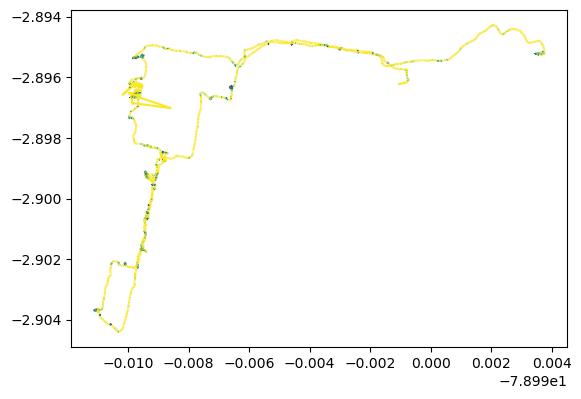

In [8]:
traj.plot(column='speed', vmax=1)


### Outlier cleaner

Outlier cleaning based in thresholds/quantile outliers, the method used is the IQR scoring method (https://en.wikipedia.org/wiki/Interquartile_range) 

This method detects the records that exists outside a quantile range that is picked based on the variance of the data and the alpha value picked to identify records that are considered noise/error, the larger the alpha, the wider the range of acceptable values

#### Max speed values after cleaning 

In [9]:
speed = pd.DataFrame(cleaned.df).sort_values(by='speed', ascending=False)
speed_km_h = speed['speed']*3600/1000
speed_km_h.head(20)

time
2023-05-03 18:36:03    5.499380
2023-05-03 20:54:54    5.499380
2023-05-03 20:47:07    5.499380
2023-05-03 18:35:30    5.499380
2023-05-03 18:31:02    5.499379
2023-05-03 18:30:49    5.499379
2023-05-03 20:49:39    5.499379
2023-05-03 18:27:55    5.499376
2023-05-03 20:21:28    5.499370
2023-05-03 20:15:27    5.499364
2023-05-03 20:02:43    5.499360
2023-05-03 18:39:35    5.499284
2023-05-03 18:36:32    5.499284
2023-05-03 20:55:50    5.499284
2023-05-03 20:57:27    5.499284
2023-05-03 20:59:09    5.499283
2023-05-03 20:54:20    5.499283
2023-05-03 18:31:09    5.499283
2023-05-03 18:30:59    5.499283
2023-05-03 18:30:53    5.499283
Name: speed, dtype: float64

### Smoother - KalmanSmootherCV

This smoother operates on the assumption of a nearly-constant velocity (CV) model. The process_noise_std and measurement_noise_std parameters can be used to tune the smoother:

process_noise_std governs the uncertainty associated with the adherence of the new (smooth) trajectories to the CV model assumption; higher values relax the assumption, therefore leading to less-smooth trajectories, and vice-versa.
measurement_noise_std controls the assumed error in the original trajectories; higher values dictate that the original trajectories are expected to be noisier (and therefore, less reliable), thus leading to smoother trajectories, and vice-versa.

### Compare

In [10]:
hvplot_defaults = {'tiles':'CartoLight', 'frame_height':320, 'frame_width':320, 'cmap':'Viridis', 'colorbar':True}
kwargs = {**hvplot_defaults, 'line_width':4}


In [11]:
smoothed = mpd.KalmanSmootherCV(cleaned).smooth(process_noise_std=0.1, measurement_noise_std=10)
    
(traj.hvplot(title='Original Trajectory', **kwargs) + 
 cleaned.hvplot(title='Cleaned Trajectory', **kwargs) + 
 smoothed.hvplot(title='Cleaned & Smoothed Trajectory', **kwargs))

:Layout
   .Overlay.I   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Path.I   :Path   [Longitude,Latitude]
      .Points.I :Points   [Longitude,Latitude]   (triangle_angle)
   .Overlay.II  :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Path.I   :Path   [Longitude,Latitude]
      .Points.I :Points   [Longitude,Latitude]   (triangle_angle)
   .Overlay.III :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Path.I   :Path   [Longitude,Latitude]
      .Points.I :Points   [Longitude,Latitude]   (triangle_angle)

In [12]:
speed = pd.DataFrame(smoothed.df).sort_values(by='speed', ascending=False)
speed_km_h = speed['speed']*3600/1000
speed_km_h.head(20)

time
2023-05-03 18:36:03    5.499380
2023-05-03 20:54:54    5.499380
2023-05-03 20:47:07    5.499380
2023-05-03 18:35:30    5.499380
2023-05-03 18:31:02    5.499379
2023-05-03 18:30:49    5.499379
2023-05-03 20:49:39    5.499379
2023-05-03 18:27:55    5.499376
2023-05-03 20:21:28    5.499370
2023-05-03 20:15:27    5.499364
2023-05-03 20:02:43    5.499360
2023-05-03 18:39:35    5.499284
2023-05-03 18:36:32    5.499284
2023-05-03 20:55:50    5.499284
2023-05-03 20:57:27    5.499284
2023-05-03 20:59:09    5.499283
2023-05-03 20:54:20    5.499283
2023-05-03 18:31:09    5.499283
2023-05-03 18:30:59    5.499283
2023-05-03 18:30:53    5.499283
Name: speed, dtype: float64

<Axes: >

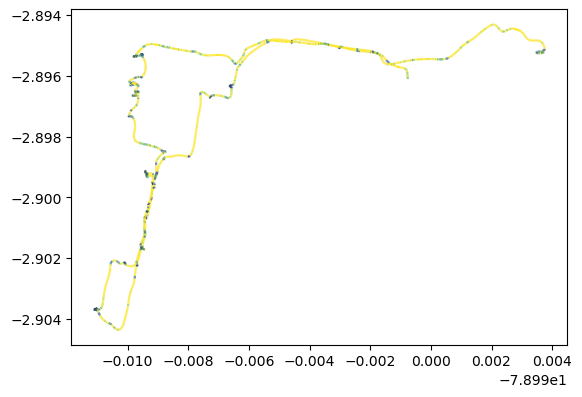

In [13]:
smoothed.plot(column='speed', vmax=1)

In [14]:
import dagstermill as __dm_dagstermill
__dm_dagstermill._teardown()
